# PRC Data breach and US - Health Breach Portal


In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import re

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [66]:
df = pd.read_csv('data/PRC Data Breach Chronology - 1.13.20.csv')
df2 =pd.read_csv('data/US-Health-Data-Breaches.csv') 


In [67]:
def movecol(df, cols_to_move=[], ref_col='', place='After'):
    
    cols = df.columns.tolist()    
    if place == 'After':
        seg1 = cols[:list(cols).index(ref_col) + 1]
        seg2 = cols_to_move
    if place == 'Before':
        seg1 = cols[:list(cols).index(ref_col)]
        seg2 = cols_to_move + [ref_col]
    
    seg1 = [i for i in seg1 if i not in seg2]
    seg3 = [i for i in cols if i not in seg1 + seg2]
    
    return(df[seg1 + seg2 + seg3])

US-Health Breach Portal

In [68]:
df2["BreachSubmissionDate"] = df2["BreachSubmissionDate"].astype(str)
df2["Year_of_Attack"]= df2["BreachSubmissionDate"].astype(str).str[12:16]
#print(df2["BreachSubmissionDate"].astype(str).str[19])

for index, row in df2.iterrows():
  if row["BreachSubmissionDate"][19] is ',':
    #print(row["BreachSubmissionDate"][18])
    df2.loc[index,'Month_of_Attack'] = row["BreachSubmissionDate"][18]
  else:
    #print(row["BreachSubmissionDate"][18:20])
    df2.loc[index,'Month_of_Attack']= row["BreachSubmissionDate"][18:20] 

In [69]:
#drop prc health + concat heal
#df.loc[df['victim.industry'] == '48-49'])

#df2['IndividualsAffected'].str.extract('(\d+)').astype(float)
df2.dropna(subset=["IndividualsAffected"],inplace=True)
df2['Total_Records'] = df2['IndividualsAffected'].str.extract('(\d+)').astype(float)

df2=df2.drop(['Location','BreachSubmissionDate','BusinessAssociatePresent','IndividualsAffected','BreachedInformationLocation'], axis=1)
df2['CoveredEntityType'] = "Healthcare "

In [70]:
df2 = df2.rename(columns={'CoveredEntityName': 'Victim_Name', 'CoveredEntityType': 'Industry', 'BreachType':'Attack_Type','WebDescription':'Summary'})
df2 = df2.drop(df2.loc[df2['Year_of_Attack'] == 'nect'].index)


In [71]:
df2['Attack_Type'].unique()

array(['Theft', 'Loss', 'Other', 'Missing["NotAvailable"]',
       'Hacking/IT Incident', 'Loss, Theft', 'Improper Disposal',
       'Improper Disposal, Loss', 'Other, Theft', 'Loss, Other',
       'Unauthorized Access/Disclosure', 'Improper Disposal, Loss, Theft',
       'Unknown', 'Theft, Unauthorized Access/Disclosure',
       'Hacking/IT Incident, Unauthorized Access/Disclosure',
       'Other, Unauthorized Access/Disclosure',
       'Hacking/IT Incident, Other', 'Other, Unknown',
       'Loss, Unauthorized Access/Disclosure, Unknown',
       'Hacking/IT Incident, Other, Unauthorized Access/Disclosure',
       'Hacking/IT Incident, Theft, Unauthorized Access/Disclosure',
       'Improper Disposal, Theft', 'Hacking/IT Incident, Theft',
       'Loss, Other, Theft',
       'Other, Theft, Unauthorized Access/Disclosure',
       'Improper Disposal, Theft, Unauthorized Access/Disclosure',
       'Loss, Unknown', 'Loss, Unauthorized Access/Disclosure',
       'Improper Disposal, Unauthori

In [72]:
df2['Attack_Type'] = df2['Attack_Type'].str.replace('Theft','Physical')
df2['Attack_Type'] = df2['Attack_Type'].str.replace('Loss','Error')
df2['Attack_Type'] = df2['Attack_Type'].str.replace('Hacking/IT Incident','Hacking')
df2['Attack_Type'] = df2['Attack_Type'].str.replace('Unauthorized Access/Disclosure','Error')
df2['Attack_Type'] = df2['Attack_Type'].str.replace('Improper Disposal','Error')
df2['Attack_Type'] = df2['Attack_Type'].str.replace('Other','Unknown')
df2['Attack_Type'] = df2['Attack_Type'].str.replace('Missing','Unknown,')

#df2['attack_type'] = df2['attack_type'].fillna('Missing["NotAvailable"]', inplace= True)

df2['Attack_Type'] =df2['Attack_Type'].str.split(',').str[0] # get first classified attack_type
df2['Attack_Type'] =df2['Attack_Type'].str.split('[').str[0]



In [73]:
df2['Attack_Type'].dtypes

dtype('O')

In [74]:
df2 = movecol(df2, cols_to_move=['Summary'], ref_col='Total_Records',place='After')

In [75]:
df2

,Victim_Name,Industry,Attack_Type,Year_of_Attack,Month_of_Attack,Total_Records,Summary
0,Brooke Army Medical Center,Healthcare,Physical,2009,10,1000.0,A binder containing the protected health infor...
1,"Mid America Kidney Stone Association, LLC",Healthcare,Physical,2009,10,1000.0,Five desktop computers containing unencrypted ...
2,Alaska Department of Health and Social Services,Healthcare,Physical,2009,10,501.0,"Missing[""NotAvailable""]"
3,Health Services for Children with Special Need...,Healthcare,Error,2009,11,3800.0,A laptop was lost by an employee while in tran...
4,"Mark D. Lurie, MD",Healthcare,Physical,2009,11,5166.0,A shared Computer that was used for backup was...
5,"L. Douglas Carlson, M.D.",Healthcare,Physical,2009,11,5257.0,A shared Computer that was used for backup was...
6,"David I. Cohen, MD",Healthcare,Physical,2009,11,857.0,A shared Computer that was used for backup was...
7,"Michele Del Vicario, MD",Healthcare,Physical,2009,11,6145.0,A shared Computer that was used for backup was...
8,"Joseph F. Lopez, MD",Healthcare,Physical,2009,11,952.0,A shared Computer that was used for backup was...
9,City of Hope National Medical Center,Healthcare,Physical,2009,11,5900.0,A laptop computer was stolen from a workforce ...


PRC Data Breach


In [76]:
import datetime as dt
df.dtypes
df['Date Made Public']=pd.to_datetime(df['Date Made Public'])
#df.sort_values(by='Date Made Public')


In [77]:
df = df.drop(['Source URL','City','State','Latitude','Longitude','Unnamed: 13','Unnamed: 14','Unnamed: 15'], axis=1)
df = df[df['Information Source'] != 'US Department of Health and Human Services']
df

,Date Made Public,Company,Type of breach,Type of organization,Total Records,Description of incident,Information Source,Year of Breach
0,2006-03-03,PayDay OK LLC,HACK,BSF,88,The company's website was breached sometime ar...,California Attorney General,2006
1,2012-01-04,"SF Fire Credit Union, Pacifica-Coastside Credi...",PORT,BSF,0,"The December 29, 2011 theft of a laptop from a...",California Attorney General,2012
2,2012-02-18,"BDO USA, Rubio's Restaurants, Inc.",PORT,BSR,0,BDO was contracted by Rubio's to perform finan...,California Attorney General,2012
3,2012-02-22,"DHI Mortgage Company, Ltd.",HACK,BSF,0,"On February 10, 2012, DHI Mortgage became awar...",California Attorney General,2012
4,2012-03-12,"Impairment Resources, LLC",PORT,MED,"14,000",An office burglary on New Year's Eve 2011 resu...,California Attorney General,2012
5,2012-03-14,"RJL Insurance Services, LLC, RJL Wealth Manage...",DISC,BSF,0,RJL Insurance Services became aware of a vulne...,California Attorney General,2012
6,2012-03-19,Kaiser Foundation Health Plan,DISC,MED,"30,000",Someone purchased a hard drive in September of...,California Attorney General,2012
7,2012-03-19,"IndyMac Bank, IndyMac Resources, Inc.",DISC,BSF,0,A security company searching the web for sensi...,California Attorney General,2012
8,2012-03-23,Manhattan Prep,HACK,BSR,0,"A hacker was able to access the names, mailing...",California Attorney General,2012
9,2012-03-31,St. Joseph's Medical Center,PHYS,MED,712,A storeroom window at Saint Joseph's HealthCar...,California Attorney General,2012


In [78]:
df['Type of breach'].unique()

array(['HACK', 'PORT', 'DISC', 'PHYS', 'UNKN', 'INSD', 'STAT', 'CARD'],
      dtype=object)

In [79]:
df.dtypes
df['Total Records']=df['Total Records'].str.replace(',', '')

In [80]:

df['Type of organization'] = df['Type of organization'].str.replace('BSF','Finance ')
df['Type of organization'] = df['Type of organization'].str.replace('BSO','Other Services ')
df['Type of organization'] = df['Type of organization'].str.replace('BSR','Retail ')
df['Type of organization'] = df['Type of organization'].str.replace('EDU','Educational ')
df['Type of organization'] = df['Type of organization'].str.replace('GOV','Public ')
df['Type of organization'] = df['Type of organization'].str.replace('MED','Healthcare ')
df['Type of organization'] = df['Type of organization'].str.replace('NGO','Public ')
df['Type of organization'] = df['Type of organization'].str.replace('UNKN','Unknown')

df['Type of breach'] = df['Type of breach'].str.replace('HACK','Hacking')
df['Type of breach'] = df['Type of breach'].str.replace('PORT','Error')
df['Type of breach'] = df['Type of breach'].str.replace('DISC','Error')
df['Type of breach'] = df['Type of breach'].str.replace('PHYS','Physical')
df['Type of breach'] = df['Type of breach'].str.replace('UNKN','Unknown')
df['Type of breach'] = df['Type of breach'].str.replace('INSD','Social')
df['Type of breach'] = df['Type of breach'].str.replace('STAT','Error')
df['Type of breach'] = df['Type of breach'].str.replace('CARD','Misuse')



In [81]:
df["Month of Breach"]  = pd.DatetimeIndex(df['Date Made Public']).month
df

,Date Made Public,Company,Type of breach,Type of organization,Total Records,Description of incident,Information Source,Year of Breach,Month of Breach
0,2006-03-03,PayDay OK LLC,Hacking,Finance,88,The company's website was breached sometime ar...,California Attorney General,2006,3
1,2012-01-04,"SF Fire Credit Union, Pacifica-Coastside Credi...",Error,Finance,0,"The December 29, 2011 theft of a laptop from a...",California Attorney General,2012,1
2,2012-02-18,"BDO USA, Rubio's Restaurants, Inc.",Error,Retail,0,BDO was contracted by Rubio's to perform finan...,California Attorney General,2012,2
3,2012-02-22,"DHI Mortgage Company, Ltd.",Hacking,Finance,0,"On February 10, 2012, DHI Mortgage became awar...",California Attorney General,2012,2
4,2012-03-12,"Impairment Resources, LLC",Error,Healthcare,14000,An office burglary on New Year's Eve 2011 resu...,California Attorney General,2012,3
5,2012-03-14,"RJL Insurance Services, LLC, RJL Wealth Manage...",Error,Finance,0,RJL Insurance Services became aware of a vulne...,California Attorney General,2012,3
6,2012-03-19,Kaiser Foundation Health Plan,Error,Healthcare,30000,Someone purchased a hard drive in September of...,California Attorney General,2012,3
7,2012-03-19,"IndyMac Bank, IndyMac Resources, Inc.",Error,Finance,0,A security company searching the web for sensi...,California Attorney General,2012,3
8,2012-03-23,Manhattan Prep,Hacking,Retail,0,"A hacker was able to access the names, mailing...",California Attorney General,2012,3
9,2012-03-31,St. Joseph's Medical Center,Physical,Healthcare,712,A storeroom window at Saint Joseph's HealthCar...,California Attorney General,2012,3


In [82]:
df=df.reset_index(drop=True)

Data Exploration of PRC Data Breach


In [83]:
#df2 = df2.drop(['IndividualsAffected','BreachedInformationLocation'], axis=1)
df = df.drop(['Information Source','Date Made Public'], axis=1)
df = movecol(df, cols_to_move=['Description of incident'], ref_col='Month of Breach',place='After')
df = movecol(df, cols_to_move=['Total Records'], ref_col='Month of Breach',place='After')
df = movecol(df, cols_to_move=['Type of breach'], ref_col='Type of organization',place='After')

Type of breach
Error       2531
Hacking     2000
Misuse        68
Physical     632
Social       606
Unknown      704
dtype: int64
['Hacking' 'Error' 'Physical' 'Unknown' 'Social' 'Misuse']


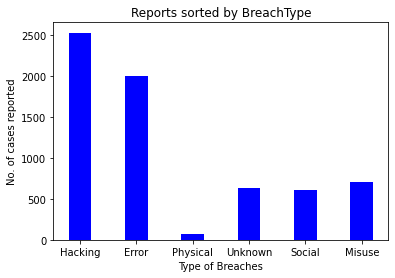

In [84]:
data = df.groupby(["Type of breach"]).size()
print(data)
xaxis= df["Type of breach"].unique()
#axis.sort()
print(xaxis)
#df.plot(x=xaxis,y=data, kind = 'bar')
plt.bar(xaxis,data,color ='b',width = 0.4)
plt.xlabel("Type of Breaches")
plt.ylabel("No. of cases reported")
plt.title("Reports sorted by BreachType")
plt.show()

Year of Breach
2005    136
2006    482
2007    456
2008    355
2009    253
2010    607
2011    597
2012    679
2013    626
2014    558
2015    284
2016    503
2017    517
2018    488
dtype: int64
[2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018]


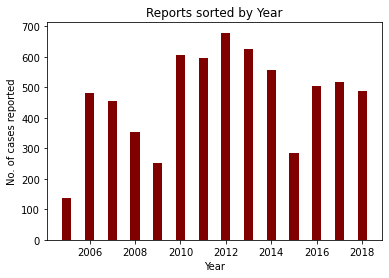

In [85]:
data = df.groupby(["Year of Breach"]).size()
print(data)
xaxis= df["Year of Breach"].unique()
xaxis.sort()
print(xaxis)
#df.plot(x=xaxis,y=data, kind = 'bar')
plt.bar(xaxis,data,color ='maroon',width = 0.4)
plt.xlabel("Year")
plt.ylabel("No. of cases reported")
plt.title("Reports sorted by Year")
plt.show()

In [86]:
df = df.rename(columns={'Company': 'Victim_Name', 'Type of organization': 'Industry', 'Type of breach':'Attack_Type','Year of Breach':'Year_of_Attack','Month of Breach':'Month_of_Attack','Total Records':'Total_Records','Description of incident':'Summary'})


In [87]:
concatenated = pd.concat([df, df2]).drop_duplicates().reset_index(drop=True)
concatenated['Summary'] = concatenated['Summary'].replace(np.nan, 'Missing')
concatenated

,Victim_Name,Industry,Attack_Type,Year_of_Attack,Month_of_Attack,Total_Records,Summary
0,PayDay OK LLC,Finance,Hacking,2006,3,88,The company's website was breached sometime ar...
1,"SF Fire Credit Union, Pacifica-Coastside Credi...",Finance,Error,2012,1,0,"The December 29, 2011 theft of a laptop from a..."
2,"BDO USA, Rubio's Restaurants, Inc.",Retail,Error,2012,2,0,BDO was contracted by Rubio's to perform finan...
3,"DHI Mortgage Company, Ltd.",Finance,Hacking,2012,2,0,"On February 10, 2012, DHI Mortgage became awar..."
4,"Impairment Resources, LLC",Healthcare,Error,2012,3,14000,An office burglary on New Year's Eve 2011 resu...
5,"RJL Insurance Services, LLC, RJL Wealth Manage...",Finance,Error,2012,3,0,RJL Insurance Services became aware of a vulne...
6,Kaiser Foundation Health Plan,Healthcare,Error,2012,3,30000,Someone purchased a hard drive in September of...
7,"IndyMac Bank, IndyMac Resources, Inc.",Finance,Error,2012,3,0,A security company searching the web for sensi...
8,Manhattan Prep,Retail,Hacking,2012,3,0,"A hacker was able to access the names, mailing..."
9,St. Joseph's Medical Center,Healthcare,Physical,2012,3,712,A storeroom window at Saint Joseph's HealthCar...


In [88]:
concatenated.to_csv('data/PRC_USBP.csv')
